<a href="https://colab.research.google.com/github/Kwagalakwe-Grace/Computer-Vision-Project/blob/main/Deep_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [14]:
import torch
import cv2
import os

In [2]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
from IPython.display import Image

Cloning the yolov5 pretrained version from github

In [5]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [6]:
%cd yolov5

/content/yolov5


Importing the annotated dataset from roboflow.

Used roboflow annotation tool to annotate the images

In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="uAdk3DElNz0nWTwG96oc")
project = rf.workspace("computer-vision-iwlzu").project("comp.vision")
dataset = project.version(2).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Comp.Vision-2 in yolov5pytorch:: 100%|██████████| 1240/1240 [00:01<00:00, 643.94it/s]


In [10]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="uAdk3DElNz0nWTwG96oc")
project = rf.workspace("computer-vision-iwlzu").project("comp.vision")
dataset = project.version(2).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Comp.Vision-2 in yolov5pytorch:: 100%|██████████| 1240/1240 [00:01<00:00, 775.43it/s]


Training the model 

In [13]:
!python train.py --img 426 --batch 16 --epochs 15 --data '/content/yolov5/Comp.Vision-2/data.yaml' --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Comp.Vision-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=15, batch_size=16, imgsz=426, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-189-g2f1eb21 Python-3.7.14 torch-1.12.1+cu113 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.

In [15]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Displaying sample of detected images on train set

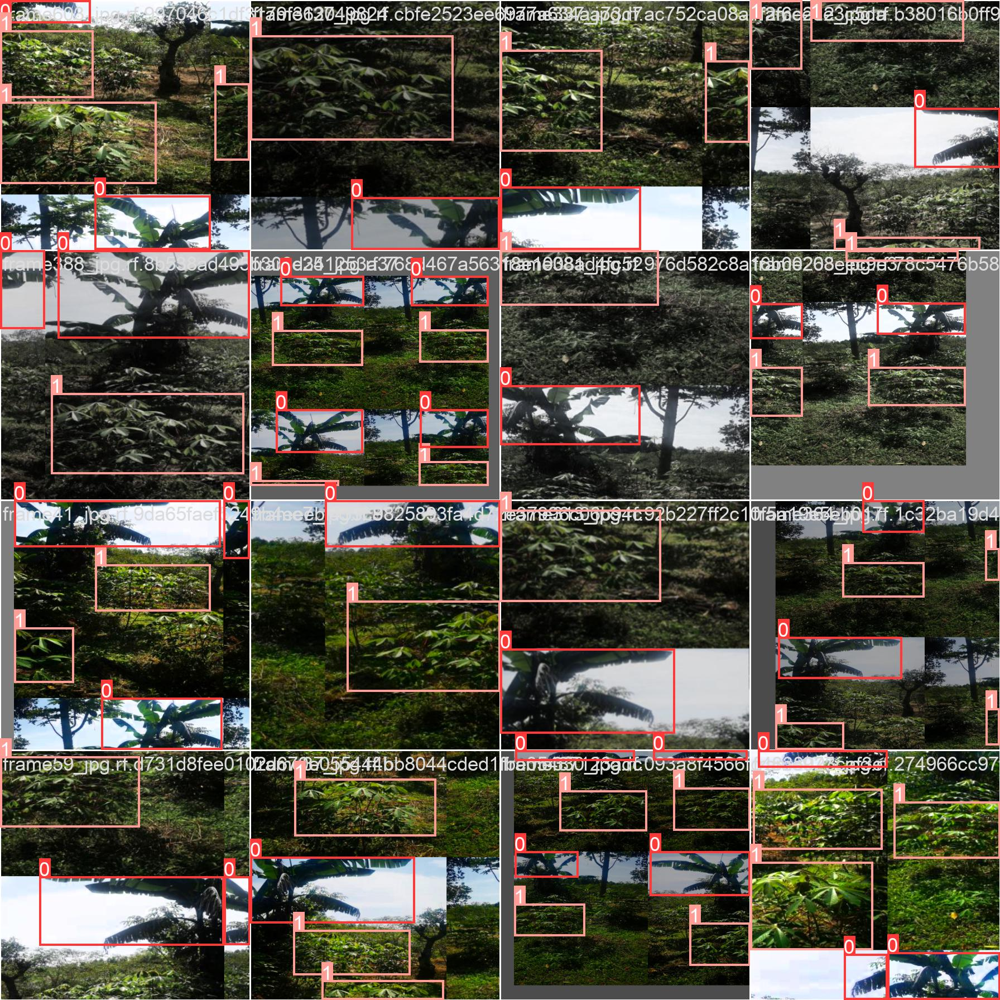

In [16]:
Image(filename = '/content/yolov5/runs/train/exp3/train_batch0.jpg', width =1000)

Testing the image on unseen data.
Used the pretrained test file in yolov5: detect.py 

In [18]:
!python detect.py --source '/content/yolov5/Comp.Vision-2/test/images/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg' --weights /content/yolov5/runs/train/exp3/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp3/weights/best.pt'], source=/content/yolov5/Comp.Vision-2/test/images/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-189-g2f1eb21 Python-3.7.14 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/Comp.Vision-2/test/images/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg: 640x640 1 Banana, 1 cassava, 466.6ms
Speed: 7.4ms pre-process, 466.6ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


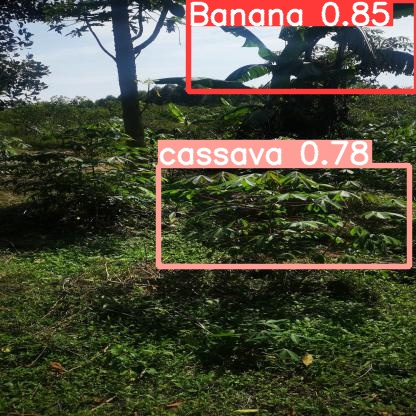

In [30]:
Image(filename = '/content/yolov5/runs/detect/exp2/frame100_jpg.rf.00c55ddcfeb86c6cfb372de7d1b490db.jpg', width = 416)

In [26]:
!python detect.py --source '/content/yolov5/Comp.Vision-2/test/images/frame11_jpg.rf.0511deaaca7a67c7c7995eb9e8092e21.jpg' --weights /content/yolov5/runs/train/exp3/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp3/weights/best.pt'], source=/content/yolov5/Comp.Vision-2/test/images/frame11_jpg.rf.0511deaaca7a67c7c7995eb9e8092e21.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-189-g2f1eb21 Python-3.7.14 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/Comp.Vision-2/test/images/frame11_jpg.rf.0511deaaca7a67c7c7995eb9e8092e21.jpg: 640x640 1 Banana, 1 cassava, 409.1ms
Speed: 3.5ms pre-process, 409.1ms inference, 1.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp5


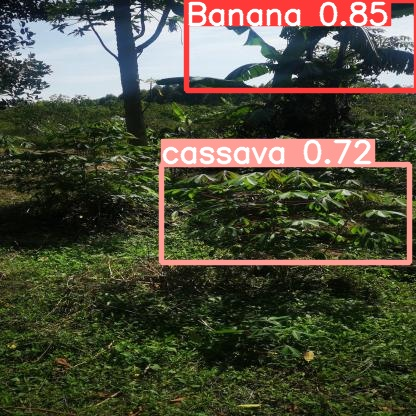

In [28]:
Image(filename = '/content/yolov5/runs/detect/exp5/frame11_jpg.rf.0511deaaca7a67c7c7995eb9e8092e21.jpg', width = 416)

In [29]:
!python detect.py --source '/content/yolov5/Comp.Vision-2/test/images/frame124_jpg.rf.1e73e2cf724b195e82bcfb1a5636a081.jpg' --weights /content/yolov5/runs/train/exp3/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp3/weights/best.pt'], source=/content/yolov5/Comp.Vision-2/test/images/frame124_jpg.rf.1e73e2cf724b195e82bcfb1a5636a081.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-189-g2f1eb21 Python-3.7.14 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/Comp.Vision-2/test/images/frame124_jpg.rf.1e73e2cf724b195e82bcfb1a5636a081.jpg: 640x640 1 Banana, 1 cassava, 440.2ms
Speed: 4.2ms pre-process, 440.2ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp6


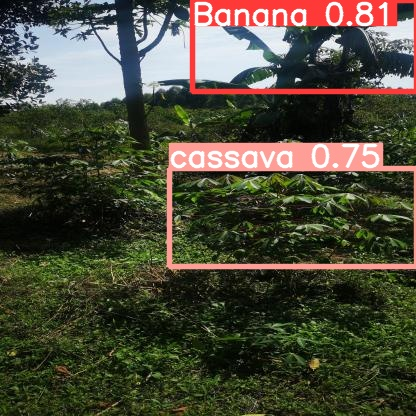

In [31]:
Image(filename = '/content/yolov5/runs/detect/exp6/frame124_jpg.rf.1e73e2cf724b195e82bcfb1a5636a081.jpg', width = 416)

In [32]:
!python detect.py --source='/content/yolov5/Comp.Vision-2/test/images/frame133_jpg.rf.e545f6ce64b057e157bbc0261b915ab7.jpg' --weights '/content/yolov5/runs/train/exp3/weights/best.pt'

detect: weights=['/content/yolov5/runs/train/exp3/weights/best.pt'], source=/content/yolov5/Comp.Vision-2/test/images/frame133_jpg.rf.e545f6ce64b057e157bbc0261b915ab7.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-189-g2f1eb21 Python-3.7.14 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/Comp.Vision-2/test/images/frame133_jpg.rf.e545f6ce64b057e157bbc0261b915ab7.jpg: 640x640 1 Banana, 1 cassava, 436.8ms
Speed: 4.7ms pre-process, 436.8ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp7


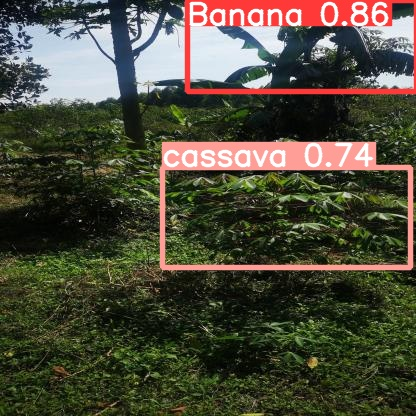

In [33]:
Image(filename = '/content/yolov5/runs/detect/exp7/frame133_jpg.rf.e545f6ce64b057e157bbc0261b915ab7.jpg', width = 416)